<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Installation of Detectron2

In [ ]:
import torch
print(torch.__version__)

1.9.0+cu102


In [ ]:
!nvidia-smi

Wed Aug  4 14:19:08 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install pyyaml==5.1
# This is the current pytorch version on Colab. Uncomment this if Colab changes its pytorch version
# !pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 6.5 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44091 sha256=c528887d3d1f9a88ab7febab54a83ea5b448df30bd9c5941886ed307da0288ef
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
     |████████████████████████████████| 6.4 MB 1.8 MB/s 
     |████████████████████████████████| 144 kB 8.3 MB/s 
     |████████████████████████████████| 130 kB 63.1 MB/s 
     |████████████████████████████████| 74 kB 4.0 MB/s 
     |████████████████████████████████| 49 kB 8.1 MB/s 
     |████████████████████████████████| 743 kB 61.5 MB/s 
     |████████████████████████████████| 722 kB 45.6 MB/s 
     |███

In [ ]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version

1.9.0+cu102 True


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
import warnings
warnings.filterwarnings('ignore')

### Register dataset 

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("helmet_head_detection_train", {}, "/content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/annotations/train_instances.json", "/content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/images/train")
register_coco_instances("helmet_head_detection_val", {}, "/content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/annotations/test_instances.json", "/content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/images/test")
#register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

#### Visulalize some annotated data

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("helmet_head_detection_train")
dataset_dicts = DatasetCatalog.get("helmet_head_detection_train")

[08/04 14:20:21 d2.data.datasets.coco]: Loading /content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/annotations/train_instances.json takes 2.36 seconds.
[08/04 14:20:21 d2.data.datasets.coco]: Loaded 3674 images in COCO format from /content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/annotations/train_instances.json


In [ ]:
my_dataset_train_metadata.thing_classes

['helmet', 'head']

[08/01 12:54:41 d2.data.datasets.coco]: Loading /content/drive/MyDrive/Helmet_Head_Detection/annotations/train_instances.json takes 2.14 seconds.
[08/01 12:54:41 d2.data.datasets.coco]: Loaded 3674 images in COCO format from /content/drive/MyDrive/Helmet_Head_Detection/annotations/train_instances.json


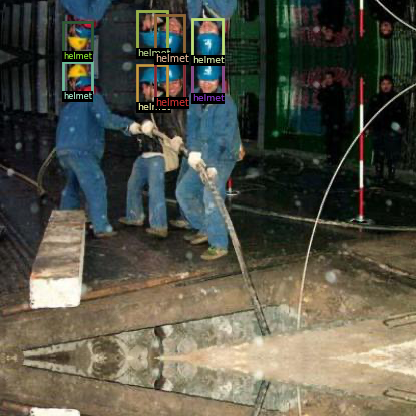

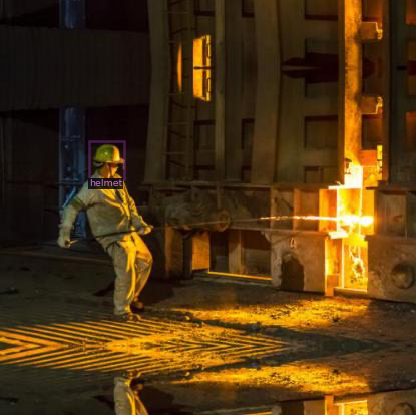

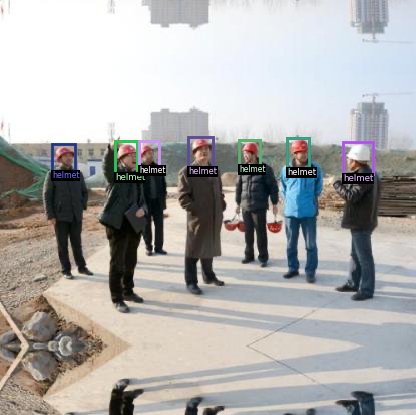

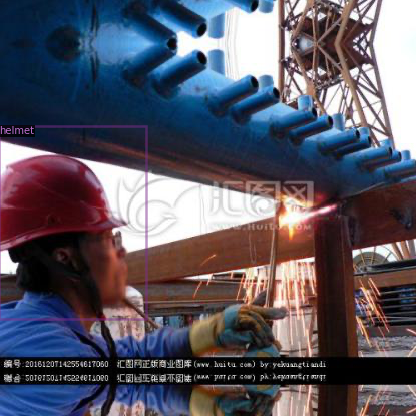

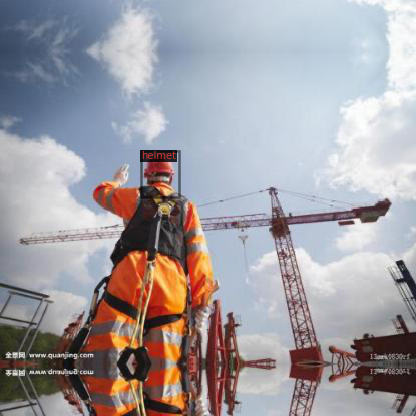

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("helmet_head_detection_train")
dataset_dicts = DatasetCatalog.get("helmet_head_detection_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 5):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=1)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

### Training

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
cfg.OUTPUT_DIR

'./output'

In [ ]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: 
#https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))
cfg.OUTPUT_DIR = '/content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/output'
cfg.DATASETS.TRAIN = ("helmet_head_detection_train",)
cfg.DATASETS.TEST = ("helmet_head_detection_val",)

cfg.DATALOADER.NUM_WORKERS = 4
# Let training initialize from model zoo
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml")
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  

cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025


#cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 12000 #adjust up if val mAP is still rising, adjust down if overfit
#cfg.SOLVER.STEPS = (6000, 7000)
#cfg.SOLVER.GAMMA = 0.05


#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.RETINANET.NUM_CLASSES = 2 #your number of classes + 1
cfg.MODEL.RETINANET.FOCAL_LOSS_ALPHA = .125
cfg.MODEL.RETINANET.FOCAL_LOSS_GAMMA = 4
cfg.TEST.EVAL_PERIOD = 1000


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
#trainer = CocoTrainer(cfg)
#trainer.resume_or_load(resume=True)
#trainer.train()

Loading config /usr/local/lib/python3.7/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


In [ ]:
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[08/01 13:05:21 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[08/01 13:05:24 d2.engine.hooks]: Loading scheduler from state_dict ...
[08/01 13:05:24 d2.engine.train_loop]: Starting training from iteration 8000
[08/01 13:05:50 d2.utils.events]:  eta: 1:29:17  iter: 8019  total_loss: 0.2949  loss_cls: 0.02772  loss_box_reg: 0.2678  time: 1.3307  data_time: 0.0743  lr: 0.001  max_mem: 3289M
[08/01 13:06:07 d2.utils.events]:  eta: 1:19:18  iter: 8039  total_loss: 0.2365  loss_cls: 0.02343  loss_box_reg: 0.2191  time: 1.0574  data_time: 0.0419  lr: 0.001  max_mem: 4202M
[08/01 13:06:20 d2.utils.events]:  eta: 0:49:55  iter: 8059  total_loss: 0.2172  loss_cls: 0.02174  loss_box_reg: 0.1954  time: 0.9310  data_time: 0.0115  lr: 0.001  max_mem: 4202M
[08/01 13:06:34 d2.utils.events]:  eta: 0:48:51  iter: 8079  total_loss: 0.1939  loss_cls: 0.01589  loss_box_reg: 0.1775  time: 0.8675  data_time: 0.0141  lr: 0.001  max_mem: 4365M
[08/01 13:06:48 d2.utils.events]:  eta: 0:48:12  iter: 8099  total_loss: 0.2364  loss_cls: 0.02336  loss_box_reg: 0.217  time: 

#### Save the Config file

In [ ]:
f = open('config_update_0108.yml', 'w')
f.write(cfg.dump())
f.close()

#### Tensorboard

In [ ]:
cd /content/drive/MyDrive/Helmet_Head_Detection

/content/drive/MyDrive/Helmet_Head_Detection


In [ ]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir output

Reusing TensorBoard on port 6006 (pid 423), started 0:01:31 ago. (Use '!kill 423' to kill it.)

<IPython.core.display.Javascript object>

### Inference on the test data

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
#cfg.MODEL.WEIGHTS = os.path.join(output_dir, "model_final.pth") 
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5 # set a custom testing threshold
predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("helmet_head_detection_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "helmet_head_detection_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [08/01 14:29:30 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[08/01 14:29:31 d2.data.datasets.coco]: Loaded 923 images in COCO format from /content/drive/MyDrive/Helmet_Head_Detection/annotations/test_instances.json
[08/01 14:29:31 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/01 14:29:31 d2.data.common]: Serializing 923 elements to byte tensors and concatenating them all ...
[08/01 14:29:31 d2.data.common]: Serialized dataset takes 1.65 MiB
[08/01 14:29:31 d2.evaluation.evaluator]: Start inference on 923 batches


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[08/01 14:29:32 d2.evaluation.evaluator]: Inference done 11/923. Dataloading: 0.0011 s/iter. Inference: 0.0798 s/iter. Eval: 0.0004 s/iter. Total: 0.0813 s/iter. ETA=0:01:14
[08/01 14:29:37 d2.evaluation.evaluator]: Inference done 72/923. Dataloading: 0.0018 s/iter. Inference: 0.0804 s/iter. Eval: 0.0004 s/iter. Total: 0.0826 s/iter. ETA=0:01:10
[08/01 14:29:42 d2.evaluation.evaluator]: Inference done 132/923. Dataloading: 0.0019 s/iter. Inference: 0.0809 s/iter. Eval: 0.0004 s/iter. Total: 0.0832 s/iter. ETA=0:01:05
[08/01 14:29:47 d2.evaluation.evaluator]: Inference done 191/923. Dataloading: 0.0018 s/iter. Inference: 0.0814 s/iter. Eval: 0.0004 s/iter. Total: 0.0837 s/iter. ETA=0:01:01
[08/01 14:29:52 d2.evaluation.evaluator]: Inference done 251/923. Dataloading: 0.0018 s/iter. Inference: 0.0817 s/iter. Eval: 0.0004 s/iter. Total: 0.0839 s/iter. ETA=0:00:56
[08/01 14:29:57 d2.evaluation.evaluator]: Inference done 311/923. Dataloading: 0.0018 s/iter. Inference: 0.0818 s/iter. Eval: 0

OrderedDict([('bbox',
              {'AP': 5.945926277033074,
               'AP-head': 5.082414707228105,
               'AP-helmet': 6.8094378468380405,
               'AP50': 10.160260439489425,
               'AP75': 6.3955769883763285,
               'APl': 31.218669632159003,
               'APm': 8.695993095404743,
               'APs': 4.38800990144499})])

In [ ]:
test_metadata = MetadataCatalog.get("helmet_head_detection_val")

In [ ]:
dataset_dicts = DatasetCatalog.get("helmet_head_detection_val")

[08/04 14:23:18 d2.data.datasets.coco]: Loading /content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/annotations/test_instances.json takes 1.18 seconds.
[08/04 14:23:18 d2.data.datasets.coco]: Loaded 923 images in COCO format from /content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/annotations/test_instances.json


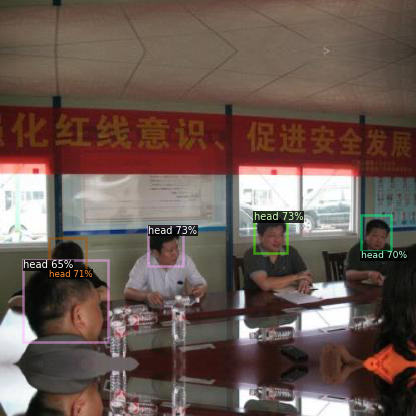

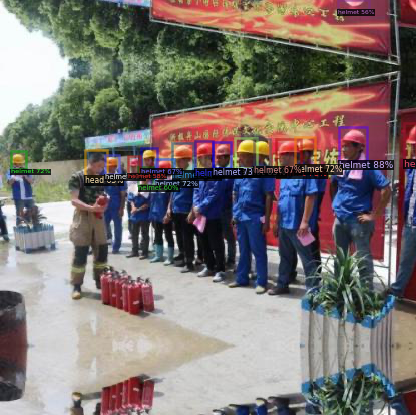

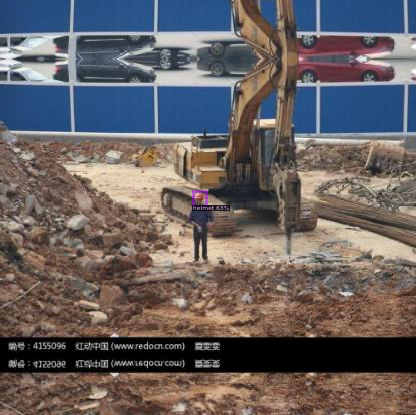

In [ ]:
from detectron2.utils.visualizer import ColorMode
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    #print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata, 
                   scale=1.0, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    #print(v.get_output())
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

### XML Generation for Test images

In [ ]:
test_img_path = '/content/drive/MyDrive/Helmet_Head_Detection/Images'

In [ ]:
import glob,os
import xml.etree.ElementTree as ET
import pandas  as pd

In [ ]:
cd /content/drive/MyDrive/Helmet_Head_Detection/test_images_xmls

/content/drive/MyDrive/Helmet_Head_Detection/test_images_xmls


In [ ]:
test_img_path = '/content/drive/MyDrive/Helmet_Head_Detection/Images'

'/content/drive/MyDrive/Helmet_Head_Detection/Images'

In [ ]:
map_dict = {0: 'helmet', 1:'head'}

In [ ]:
for d in glob.iglob(test_img_path + '/*.png'):
    im = cv2.imread(d)
    #cv2_imshow(im[:, :, ::])
    width, height, depth =  im.shape
    filename = d.split('/')[-1].split('.')[0]
    #print(width, height, depth, filename)
    
    outputs = predictor(im)
    #print(outputs['instances'].scores)
    #print(outputs['instances'].pred_classes)
    boxes = outputs['instances'].pred_boxes.tensor.cpu().numpy()
    classes = outputs['instances'].pred_classes.cpu().numpy()
    classes = pd.Series(classes)
    classes = classes.map(map_dict)
    root = ET.Element("annotation")
        
    m1 = ET.Element("folder")
    m1.text = 'images'
    root.append (m1)

    b1 = ET.Element('filename')
    b1.text = d.split('/')[-1]
    root.append (b1)

    b2 = ET.Element('size')
    b20 = ET.SubElement(b2, "width")
    b20.text = str(width)

    b21 = ET.SubElement(b2, "height")
    b21.text = str(height)

    b22 = ET.SubElement(b2, "depth")
    b22.text = str(depth)
    root.append (b2)

    b3 = ET.Element('segmented')
    b3.text = "0"
    root.append (b3)
    for class_, loc in zip(classes, boxes):
        xmin, ymin, xmax, ymax  = loc
        b4 = ET.Element('object')
        b41 = ET.SubElement(b4, "name")
        b41.text = class_

        b42 = ET.SubElement(b4, "pose")
        b42.text = "Unspecified"

        b43 = ET.SubElement(b4, "truncated")
        b43.text = "0"

        b44 = ET.SubElement(b4, "occluded")
        b44.text = "0"

        b45 = ET.SubElement(b4, "difficult")
        b45.text = "0"

        b46 = ET.SubElement(b4, "bndbox")
        b461 = ET.SubElement(b46, "xmin")
        b461.text = str(int(xmin))

        b462 = ET.SubElement(b46, "ymin")
        b462.text = str(int(ymin))
        

        b463 = ET.SubElement(b46, "xmax")
        b463.text = str(int(xmax))


        b464 = ET.SubElement(b46, "ymax")
        b464.text = str(int(ymax))
        root.append(b4)

    # Converting the xml data to byte object,
    # for allowing flushing data to file 
    # stream
    b_xml = ET.tostring(root)

    # Opening a file under the name `items2.xml`,
    # with operation mode `wb` (write + binary)
    with open(filename + ".xml", "wb") as f:
        f.write(b_xml)

In [ ]:
test_xml = '/content/drive/MyDrive/Helmet_Head_Detection/test_images_xmls'

print("Total test xml files contain in folder:\n")
print(len([xml_file for xml_file in glob.glob(test_xml + '/*.xml')]))

Total test xml files contain in folder:

250


### Video Inference

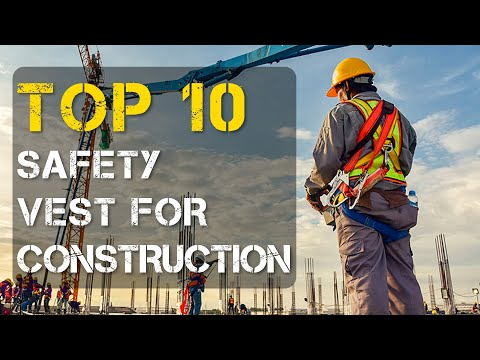

In [ ]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("6PoPwZ0WO9w", width=500)
display(video)

In [ ]:
# Install dependencies, download the video, and crop 5 seconds for processing
!pip install youtube-dl
!youtube-dl https://www.youtube.com/watch?v=6PoPwZ0WO9w -f 22 -o video.mp4
!ffmpeg -i video.mp4 -t 00:00:06 -r 2 -c:v copy video-clip.mp4

     |████████████████████████████████| 1.9 MB 7.5 MB/s 
[youtube] 6PoPwZ0WO9w: Downloading webpage
[youtube] 6PoPwZ0WO9w: Downloading MPD manifest
[download] Destination: video.mp4
[download] 100% of 159.05MiB in 00:03
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --ena

In [ ]:
cd /content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/Statge_1

/content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/Statge_1


In [ ]:
# Run frame-by-frame inference demo on this video (takes 3-4 minutes) with the "demo.py" tool we provided in the repo.
#!git clone https://github.com/facebookresearch/detectron2
# Note: this is currently BROKEN due to missing codec. See https://github.com/facebookresearch/detectron2/issues/2901 for workaround.
%run /content/detectron2/demo/demo.py --config-file /content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/config_update_0108_1.yml --video-input /content/video.mp4 --confidence-threshold 0.6 --output video-output_head.mp4 \
  --opts MODEL.WEIGHTS /content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/output/model_final.pth

[08/04 14:47:31 detectron2]: Arguments: Namespace(confidence_threshold=0.6, config_file='/content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/config_update_0108_1.yml', input=None, opts=['MODEL.WEIGHTS', '/content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/output/model_final.pth'], output='video-output_head.mp4', video_input='/content/video.mp4', webcam=False)
[08/04 14:47:32 fvcore.common.checkpoint]: [Checkpointer] Loading from /content/drive/MyDrive/Hackathons/Wobot_Hack_Detectron2/output/model_final.pth ...


100%|██████████| 16663/16663 [1:01:27<00:00,  4.52it/s]


In [ ]:
# Download the results
from google.colab import files
files.download('video-clip.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>